# Traffic flow analysis

<img src="https://github.com/retkowsky/CustomVision_Datasets/blob/master/trafficyolo.jpg?raw=true" width = 800>

## 1. Settings

In [1]:
#!pip install imageai
#!pip install --upgrade tensorflow
#!pip install moviepy
#!pip install pytube
#!pip install xlwt

In [2]:
import os
import cv2
import matplotlib.pyplot as plt
import os.path
import os
import urllib
import datetime
import pandas as pd
import moviepy
from moviepy.editor import *
from imageai.Detection import VideoObjectDetection
import xlwt
from azureml.core.experiment import Experiment
from azureml.core.workspace import Workspace
import time
import pytube
from pytube.streams import Stream
import seaborn as sns
import random

In [3]:
import sys
sys.version

'3.6.9 |Anaconda, Inc.| (default, Jul 30 2019, 19:07:31) \n[GCC 7.3.0]'

In [4]:
print(datetime.datetime.now())

2022-01-19 09:09:25.513084


In [5]:
print("Current directory is:\n", os.getcwd())

Current directory is:
 /mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow5/code/Users/seretkow/ComputerVision/Vehicles Detection


In [6]:
import platform,socket,re,uuid,json,psutil,logging

def getSystemInfo():
    try:
        info={}
        info['Platform']=platform.system()
        info['Platform-release']=platform.release()
        info['Platform-version']=platform.version()
        info['Architecture']=platform.machine()
        info['Hostname']=socket.gethostname()
        info['IP-address']=socket.gethostbyname(socket.gethostname())
        info['MAC-address']=':'.join(re.findall('..', '%012x' % uuid.getnode()))
        info['Processeur']=platform.processor()
        info['RAM']=str(round(psutil.virtual_memory().total / (1024.0 **3)))+" Go"
        return json.dumps(info)
    
    except Exception as e:
        logging.exception(e)

json.loads(getSystemInfo())

{'Platform': 'Linux',
 'Platform-release': '5.4.0-1063-azure',
 'Platform-version': '#66~18.04.1-Ubuntu SMP Thu Oct 21 09:59:28 UTC 2021',
 'Architecture': 'x86_64',
 'Hostname': 'seretkow5',
 'IP-address': '127.0.0.1',
 'MAC-address': '1d:20:b8:54:27:95',
 'Processeur': 'x86_64',
 'RAM': '220 Go'}

In [7]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)

if gpu_info.find('failed') >= 0:
    print('Select an Azure ML GPU compute instance ')

else:
    print(gpu_info)

Wed Jan 19 09:09:27 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           On   | 00000001:00:00.0 Off |                    0 |
| N/A   34C    P8    26W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla K80           On   | 00000002:00:00.0 Off |                    0 |
| N/A   

In [8]:
ws = Workspace.from_config()
print('Current Azure ML Workspace: ' + ws.name, 
      'Region: ' + ws.location, 
      'Ressource Group: ' + ws.resource_group, sep='\n')

Current Azure ML Workspace: AMLworkshop
Region: westeurope
Ressource Group: AMLworkshop-rg


In [9]:
from azureml.core import experiment
experiment = Experiment(workspace=ws, name="TrafficFlowAnalysis")

In [10]:
experiment

Name,Workspace,Report Page,Docs Page
TrafficFlowAnalysis,AMLworkshop,Link to Azure Machine Learning studio,Link to Documentation


## 2. Downloading yolo.h5 file

In [11]:
def createdir(dirname):
    import os.path
    from os import path
    if path.os.path.isdir(dirname) :
        print("Directory:", dirname, "exists!")
    else:
        print("Creating directory:", dirname)
        os.mkdir(dirname)
        print("Done!")

In [13]:
createdir('yolo')

Creating directory: yolo
Done!


In [14]:
if os.path.isfile('yolo/yolo.h5'):
    print("yolo.h5 file is available.")

else:
    print("yolo.h5 file not there => Let's download it...\n")
    download_url = 'https://github.com/OlafenwaMoses/ImageAI/releases/download/1.0/yolo.h5'
    yolo_file = 'yolo/yolo.h5'
    t1 = datetime.datetime.now()
    print(t1, "Downloading yolo file...")
    urllib.request.urlretrieve(download_url, filename=yolo_file)
    t2 = datetime.datetime.now()
    print("Done in:", t2 - t1)

yolo.h5 file not there => Let's download it...

2022-01-19 09:09:57.018213 Downloading yolo file...
Done in: 0:00:14.088980


In [15]:
!ls yolo/*.* -lh

-rwxrwxrwx 1 root root 238M Jan 19 09:10 yolo/yolo.h5


In [16]:
from imageai import Detection

modelpath = "yolo/yolo.h5" # Yolo file location

yolo = Detection.ObjectDetection()
yolo.setModelTypeAsYOLOv3()
yolo.setModelPath(modelpath)
yolo.loadModel()

There are 80 possible objects that you can detect with the
ObjectDetection class, and they are as seen below.

    person,   bicycle,   car,   motorcycle,   airplane,
    bus,   train,   truck,   boat,   traffic light,   fire hydrant,   stop_sign,
    parking meter,   bench,   bird,   cat,   dog,   horse,   sheep,   cow,   elephant,   bear,   zebra,
    giraffe,   backpack,   umbrella,   handbag,   tie,   suitcase,   frisbee,   skis,   snowboard,
    sports ball,   kite,   baseball bat,   baseball glove,   skateboard,   surfboard,   tennis racket,
    bottle,   wine glass,   cup,   fork,   knife,   spoon,   bowl,   banana,   apple,   sandwich,   orange,
    broccoli,   carrot,   hot dog,   pizza,   donot,   cake,   chair,   couch,   potted plant,   bed,
    dining table,   toilet,   tv,   laptop,   mouse,   remote,   keyboard,   cell phone,   microwave,
    oven,   toaster,   sink,   refrigerator,   book,   clock,   vase,   scissors,   teddy bear,   hair dryer,
    toothbrush.

## 3. Analyzing an image

In [18]:
import urllib.request

dirimage = 'images/'
image_file = dirimage + 'paristraffic.jpg'

createdir(dirimage)

if os.path.isfile(image_file):
    print("Image file", image_file, "is available.")

else:
    print("Let's download the image...\n")

    download_url = 'https://github.com/retkowsky/CustomVision_Datasets/blob/master/paristraffic.jpg?raw=true'   
    t1 = datetime.datetime.now()
    print(t1, "Downloading image file...")
    urllib.request.urlretrieve(download_url, filename = image_file)
    t2 = datetime.datetime.now()
    print("Done in:", t2 - t1)

Creating directory: images/
Done!
Let's download the image...

2022-01-19 09:10:45.740393 Downloading image file...
Done in: 0:00:00.674748


### 3.1 Initial image

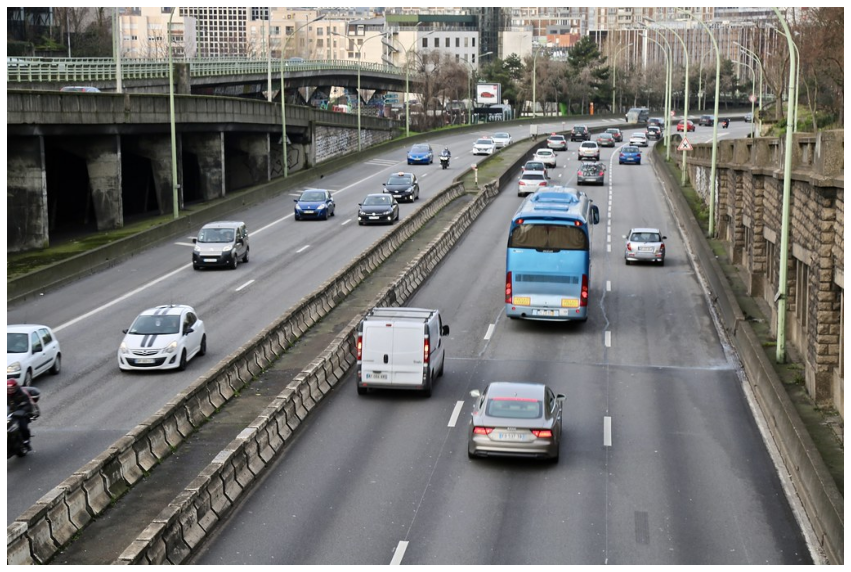

In [19]:
img = cv2.imread(image_file)

plt.figure(figsize=(15,15)) 
plt.axis('off')
image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)

In [21]:
print("Image shape:", img.shape)

Image shape: (683, 1024, 3)


In [22]:
img, preds = yolo.detectObjectsFromImage(input_image = image_file, 
                                         custom_objects = None, 
                                         input_type="file",
                                         output_type="array",
                                         minimum_percentage_probability = 50,
                                         display_percentage_probability = True,
                                         display_object_name = True)

### 3.2 Results

In [23]:
preds

[{'name': 'bus',
  'percentage_probability': 97.72170186042786,
  'box_points': [607, 260, 721, 414]},
 {'name': 'car',
  'percentage_probability': 99.86085295677185,
  'box_points': [133, 365, 248, 455]},
 {'name': 'truck',
  'percentage_probability': 88.93810510635376,
  'box_points': [427, 384, 539, 497]},
 {'name': 'car',
  'percentage_probability': 95.23489475250244,
  'box_points': [559, 476, 682, 579]},
 {'name': 'car',
  'percentage_probability': 63.502418994903564,
  'box_points': [689, 158, 712, 176]},
 {'name': 'car',
  'percentage_probability': 78.32612991333008,
  'box_points': [724, 165, 751, 183]},
 {'name': 'car',
  'percentage_probability': 97.8578507900238,
  'box_points': [488, 175, 523, 204]},
 {'name': 'car',
  'percentage_probability': 56.31122589111328,
  'box_points': [528, 179, 543, 203]},
 {'name': 'car',
  'percentage_probability': 93.41005682945251,
  'box_points': [568, 169, 599, 192]},
 {'name': 'car',
  'percentage_probability': 56.92054629325867,
  'box_

In [24]:
print("\033[1;31;34mTotal of detected attributes =", len(preds), '\n')
print("Details:")

i = 1
nb_cars = nb_trucks = nb_motos = nb_persons = nb_bus = nb_vehicles = 0

for key in preds:
    #print(i, key)
    print(i, '\t', str.upper(key['name']), ' ', round(key['percentage_probability']/100, 5), 
          ' BBox:', key['box_points'])
    if key['name'] == 'car':
        nb_cars +=1
    if key['name'] == 'truck':
        nb_trucks +=1
    if key['name'] == 'motorcycle':
        nb_motos +=1
    if key['name'] == 'person':
        nb_persons +=1
    if key['name'] == 'bus':
        nb_bus +=1
    i +=1

nb_vehicles = nb_cars + nb_motos + nb_trucks + nb_bus

print("\nNumber of vehicles =", nb_vehicles)
print("- Number of cars =", nb_cars)
print("- Number of trucks =", nb_trucks)
print("- Number of buses =", nb_bus)
print("- Number of motorcycles =", nb_motos)
print("\nNumber of persons =", nb_persons)

Total of detected attributes = 24 

Details:
1 	 BUS   0.97722  BBox: [607, 260, 721, 414]
2 	 CAR   0.99861  BBox: [133, 365, 248, 455]
3 	 TRUCK   0.88938  BBox: [427, 384, 539, 497]
4 	 CAR   0.95235  BBox: [559, 476, 682, 579]
5 	 CAR   0.63502  BBox: [689, 158, 712, 176]
6 	 CAR   0.78326  BBox: [724, 165, 751, 183]
7 	 CAR   0.97858  BBox: [488, 175, 523, 204]
8 	 CAR   0.56311  BBox: [528, 179, 543, 203]
9 	 CAR   0.9341  BBox: [568, 169, 599, 192]
10 	 CAR   0.56921  BBox: [649, 177, 680, 197]
11 	 CAR   0.8328  BBox: [657, 170, 688, 191]
12 	 CAR   0.90658  BBox: [698, 179, 726, 201]
13 	 CAR   0.9525  BBox: [747, 183, 780, 206]
14 	 CAR   0.68494  BBox: [640, 192, 671, 213]
15 	 CAR   0.97063  BBox: [458, 211, 508, 247]
16 	 CAR   0.9445  BBox: [622, 210, 663, 239]
17 	 CAR   0.79531  BBox: [692, 206, 732, 231]
18 	 CAR   0.99737  BBox: [349, 229, 404, 269]
19 	 CAR   0.99471  BBox: [426, 235, 481, 278]
20 	 CAR   0.64069  BBox: [628, 234, 722, 284]
21 	 CAR   0.98534  BBox: 

True

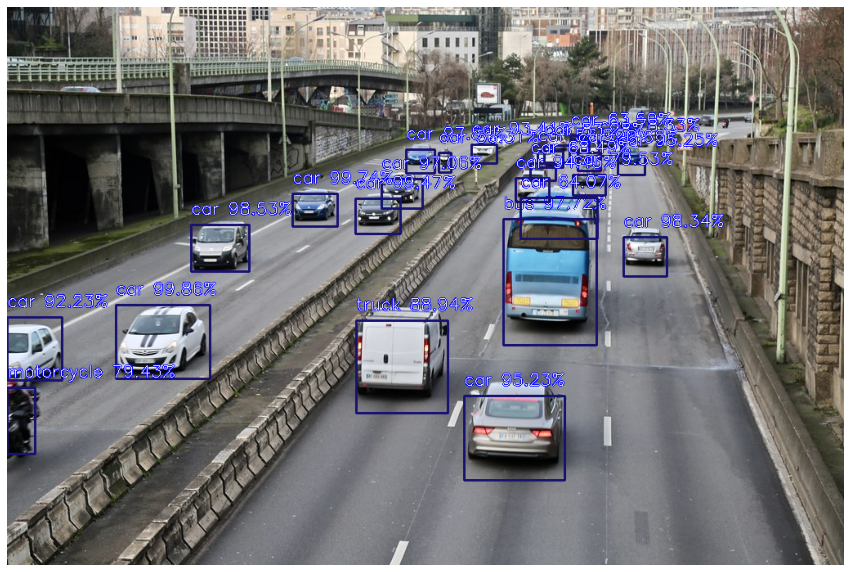

In [25]:
plt.figure(figsize=(15,15)) 
plt.axis('off')
image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)

processedimage_file = dirimage + "result.jpg"
cv2.imwrite(processedimage_file, img)

## 4. Video analytics

Video is available here: https://www.youtube.com/watch?v=wqctLW0Hb_0&t=1s

In [26]:
YOUTUBE_LINK = "https://www.youtube.com/watch?v=wqctLW0Hb_0&t=1s"

### 4.1 Let's download this video

In [27]:
def DownloadYTVideo(link):
    t1 = datetime.datetime.now()
    youTube = pytube.YouTube(link)
    print("Downloading YouTube video...")
    stream = youTube.streams.get_highest_resolution()
    stream.download()
    t2 = datetime.datetime.now()
    print("Done in:", t2 - t1)

In [28]:
createdir('videos')
os.chdir('videos')
DownloadYTVideo(YOUTUBE_LINK)
os.chdir('..')

Creating directory: videos
Done!
Done in: 0:00:07.737264


In [29]:
!ls videos/*.* -lh

-rwxrwxrwx 1 root root 183M Jan 19 09:12 'videos/Road traffic video for object recognition.mp4'


In [30]:
VIDEOFILE = 'videos/Road traffic video for object recognition.mp4'

In [31]:
MYVIDEOFILE = VideoFileClip(VIDEOFILE)

fps = MYVIDEOFILE.fps
w = MYVIDEOFILE.w
h = MYVIDEOFILE.h
duration = MYVIDEOFILE.duration

nbframes = int(fps * duration)
duration_min = round(duration / 60, 2)

print("\033[1;31;34mVideo File :", VIDEOFILE)
print("\nWidth:", w, "Height:", h)
print("FPS =", fps)
print("Duration in minutes :", duration_min)
print("Number of frames =", nbframes)

Video File : videos/Road traffic video for object recognition.mp4

Width: 1280 Height: 720
FPS = 25.0
Duration in minutes : 34.13
Number of frames = 51201


### 4.2 Let's create a 5 sec video clip from the initial video

In [32]:
MYCLIP = MYVIDEOFILE.subclip(0, 5)

clipduration = MYCLIP.duration 
print("Clip duration =", clipduration, 'seconds\n')
MYCLIP.ipython_display()

Clip duration = 5 seconds

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [33]:
createdir('output')

Creating directory: output
Done!


In [34]:
# Saving the video clip
MYCLIPNAME = "output/myclip.mp4"
MYCLIP.write_videofile(MYCLIPNAME)

Moviepy - Building video output/myclip.mp4.
MoviePy - Writing audio in myclipTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output/myclip.mp4



Moviepy - Done !
Moviepy - video ready output/myclip.mp4


In [35]:
!ls output/myclip.mp4 -lh

-rwxrwxrwx 1 root root 665K Jan 19 09:12 output/myclip.mp4


In [36]:
MYVIDEOFILE = VideoFileClip(MYCLIPNAME)

fps = MYVIDEOFILE.fps
w = MYVIDEOFILE.w
h = MYVIDEOFILE.h
duration = MYVIDEOFILE.duration

nbframes = int(fps * duration)

print("\033[1;31;34mVideo File :", MYCLIPNAME)
print("\nWidth:", w, "Height:", h)
print("FPS =", fps)
print("Duration in sec :", duration)
print("Number of frames =", nbframes)

Video File : output/myclip.mp4

Width: 1280 Height: 720
FPS = 25.0
Duration in sec : 5.04
Number of frames = 126


### 4.3 Let's analyse the sample video

In [37]:
print(MYCLIPNAME)
MYCLIPRESULTS = "output/myclip_output"

output/myclip.mp4


In [38]:
t1 = datetime.datetime.now()
execution_path = os.getcwd()

print(t1, "Analysing video ...\n")

detector = VideoObjectDetection()
detector.setModelTypeAsYOLOv3()
detector.setModelPath( os.path.join(execution_path , "yolo/yolo.h5"))
detector.loadModel()

video_path = detector.detectObjectsFromVideo(input_file_path=os.path.join(execution_path, MYCLIPNAME),
                            output_file_path = os.path.join(execution_path, MYCLIPRESULTS),
                            frames_per_second = 25, 
                            log_progress = True)

t2 = datetime.datetime.now()
print("\nDone in", t2 - t1)

2022-01-19 09:13:04.252014 Analysing video ...

Processing Frame :  1
Processing Frame :  2
Processing Frame :  3
Processing Frame :  4
Processing Frame :  5
Processing Frame :  6
Processing Frame :  7
Processing Frame :  8
Processing Frame :  9
Processing Frame :  10
Processing Frame :  11
Processing Frame :  12
Processing Frame :  13
Processing Frame :  14
Processing Frame :  15
Processing Frame :  16
Processing Frame :  17
Processing Frame :  18
Processing Frame :  19
Processing Frame :  20
Processing Frame :  21
Processing Frame :  22
Processing Frame :  23
Processing Frame :  24
Processing Frame :  25
Processing Frame :  26
Processing Frame :  27
Processing Frame :  28
Processing Frame :  29
Processing Frame :  30
Processing Frame :  31
Processing Frame :  32
Processing Frame :  33
Processing Frame :  34
Processing Frame :  35
Processing Frame :  36
Processing Frame :  37
Processing Frame :  38
Processing Frame :  39
Processing Frame :  40
Processing Frame :  41
Processing Frame :

### 4.4 Results

In [39]:
!ls output/myclip_output.avi

output/myclip_output.avi


In [40]:
# Displaying the processed video clip
VIDEOCLIP_RESULTS = "output/myclip_output.avi"

result = VideoFileClip(VIDEOCLIP_RESULTS)
result.ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


## 5. Analysing a video file or a streaming video with additional features for advanced traffic flow analysis

> Let's use now the same video but with a different time length. We have an initial long video (34 min). **So we will create first a video clip in order to reduce the time**. We will not analyse all the frames (we have a FPS = 25). We can decide to extract only some frames. We will count the vehicules in total and for each lanes (left lanes & right lanes).

**Some results will be saved into Azure ML experiments.**

In [41]:
# Directories to create if needed
dir1 = 'results'
dir2 = 'results/captures'

createdir(dir1)
createdir(dir2)

Creating directory: results
Done!
Creating directory: results/captures
Done!


In [42]:
# videofile or a RTSP link for the Real Time Streaming protocol (initial video) from the YouTube link
WEBCAM = "videos/Road traffic video for object recognition.mp4" 

### 5.1 We will create a new videoclip from the initial video

In [51]:
number_of_seconds = 15

In [52]:
MYVIDEOFILE = VideoFileClip(WEBCAM)
MYCLIP = MYVIDEOFILE.subclip(0, number_of_seconds) # Just taking the first 60 seconds

clipduration = MYCLIP.duration # Compute the duration in secs
print("Clip duration =", clipduration, 'seconds')

Clip duration = 15 seconds


In [53]:
# Saving the sample video
MYCLIPNAME = "output/RoadTrafficSample.mp4"
MYCLIP.write_videofile(MYCLIPNAME)

Moviepy - Building video output/RoadTrafficSample.mp4.
MoviePy - Writing audio in RoadTrafficSampleTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video output/RoadTrafficSample.mp4



Moviepy - Done !
Moviepy - video ready output/RoadTrafficSample.mp4


In [54]:
MYVIDEOFILE = VideoFileClip(MYCLIPNAME)
fps = MYVIDEOFILE.fps
duration = MYVIDEOFILE.duration
nbframes = int(fps * duration)
duration_min = round(duration / 60, 2)

print("\033[1;31;34mVideo Clip:", MYCLIPNAME)
print("\nFPS =", fps)
print("Duration in minutes:", duration_min)
print("Duration in seconds:", duration)
print("Number of frames =", nbframes)

Video Clip: output/RoadTrafficSample.mp4

FPS = 25.0
Duration in minutes: 0.25
Duration in seconds: 15.05
Number of frames = 376


In [55]:
experiment

Name,Workspace,Report Page,Docs Page
TrafficFlowAnalysis,AMLworkshop,Link to Azure Machine Learning studio,Link to Documentation


### 5.2 Settings

In [56]:
# Min confidence in % for object detection
minpctprob = 50

# Frontier x coordinate (to define left lanes & right lanes)
x_lanes_frontier = 650

# Low & high limit for Traffic class (Light, Moderate, Heavy)
low_limit = 5
high_limit = 10

# Width & Height of the video
MYVIDEOFILE = VideoFileClip(WEBCAM)
w = MYVIDEOFILE.w
h = MYVIDEOFILE.h

# Sampling frame
#sampling_frames = 25 # for every 25 frames => 1 frame per each second because we have FPS = 25
sampling_frames = 1 # for every frame so we will get 25 frames to be analysed for each second (we have FPS = 25)

# Logging infos into Azure ML experiment
run = experiment.start_logging(snapshot_directory = None)

In [58]:
nbprocessedframes = nbframes / sampling_frames
nbframespersec = sampling_frames / fps

print("\033[1;31;34mVideo will be processed with:\n")

print("Min confidence in % =", minpctprob)
print("Sampling Frames =", sampling_frames)
print("Number of frames to analyse =", int(nbprocessedframes))
print("Video will be processed each", nbframespersec, "seconds. Note: FPS =", fps)
print("\nVideo input size: width =", w, "height =", h)

Video will be processed with:

Min confidence in % = 50
Sampling Frames = 1
Number of frames to analyse = 376
Video will be processed each 0.04 seconds. Note: FPS = 25.0

Video input size: width = 1280 height = 720


### 5.3 Processing the video

In [59]:
#WEBCAM = "videos/Road traffic video for object recognition.mp4" # The initial full video which is long (34 min)
WEBCAM = "output/RoadTrafficSample.mp4" # The sample video we made before

In [60]:
from IPython.display import Video
Video(WEBCAM)

In [61]:
from imageai import Detection
modelpath = "yolo/yolo.h5"

yolo = Detection.ObjectDetection()
yolo.setModelTypeAsYOLOv3()
yolo.setModelPath(modelpath)
yolo.loadModel()

Processing the video input:  output/RoadTrafficSample.mp4 for every 1 frames

2022-01-19 09:25:48.597086 Processing frame = 0000001 

1 	 CAR   0.58702  Bounding Box: [661, 286, 690, 303]
2 	 CAR   0.51692  Bounding Box: [709, 288, 734, 303]
3 	 CAR   0.50432  Bounding Box: [541, 297, 572, 320]
4 	 CAR   0.61909  Bounding Box: [664, 292, 697, 316]
5 	 TRUCK   0.88646  Bounding Box: [754, 293, 807, 345]
6 	 CAR   0.51949  Bounding Box: [488, 317, 528, 340]
7 	 CAR   0.92725  Bounding Box: [562, 322, 595, 344]
8 	 CAR   0.7864  Bounding Box: [677, 316, 709, 340]
9 	 CAR   0.81106  Bounding Box: [438, 337, 480, 359]
10 	 CAR   0.95013  Bounding Box: [491, 337, 534, 364]
11 	 CAR   0.96104  Bounding Box: [532, 374, 578, 408]
12 	 CAR   0.99153  Bounding Box: [738, 418, 793, 475]
13 	 CAR   0.98861  Bounding Box: [377, 419, 439, 474]
14 	 CAR   0.79856  Bounding Box: [200, 442, 287, 506]
15 	 CAR   0.98875  Bounding Box: [860, 450, 929, 517]
16 	 CAR   0.93108  Bounding Box: [1029, 514, 115

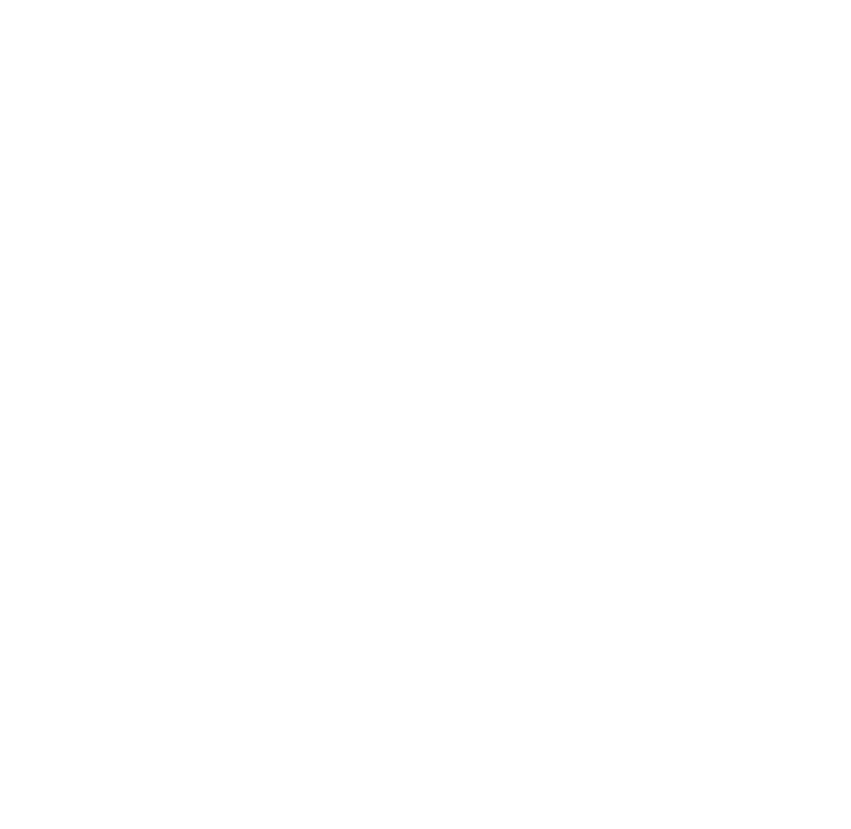

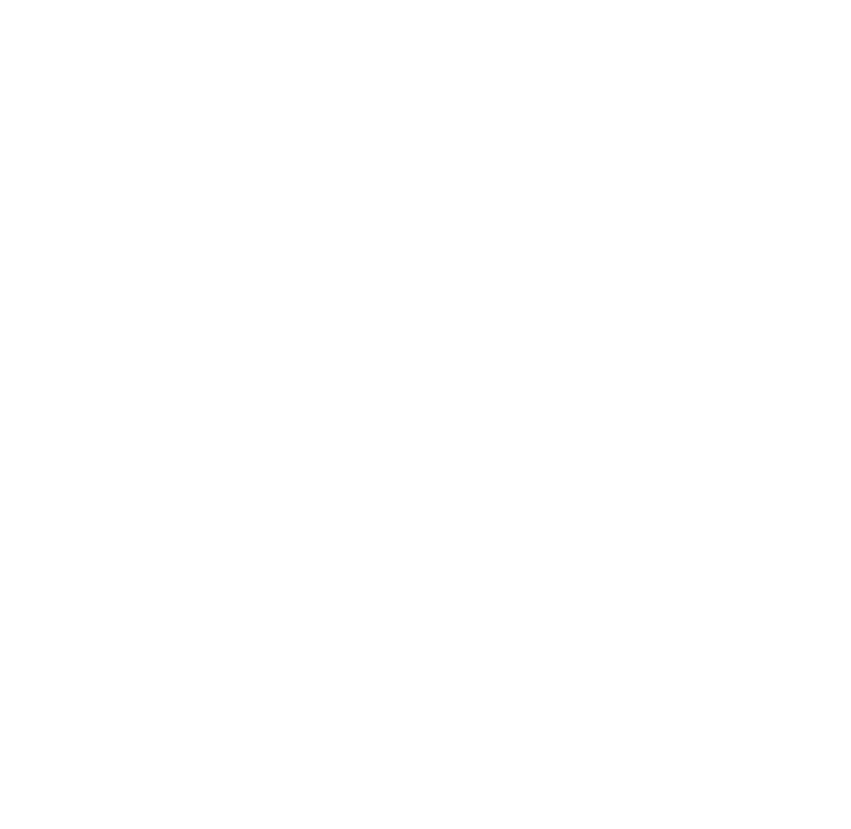

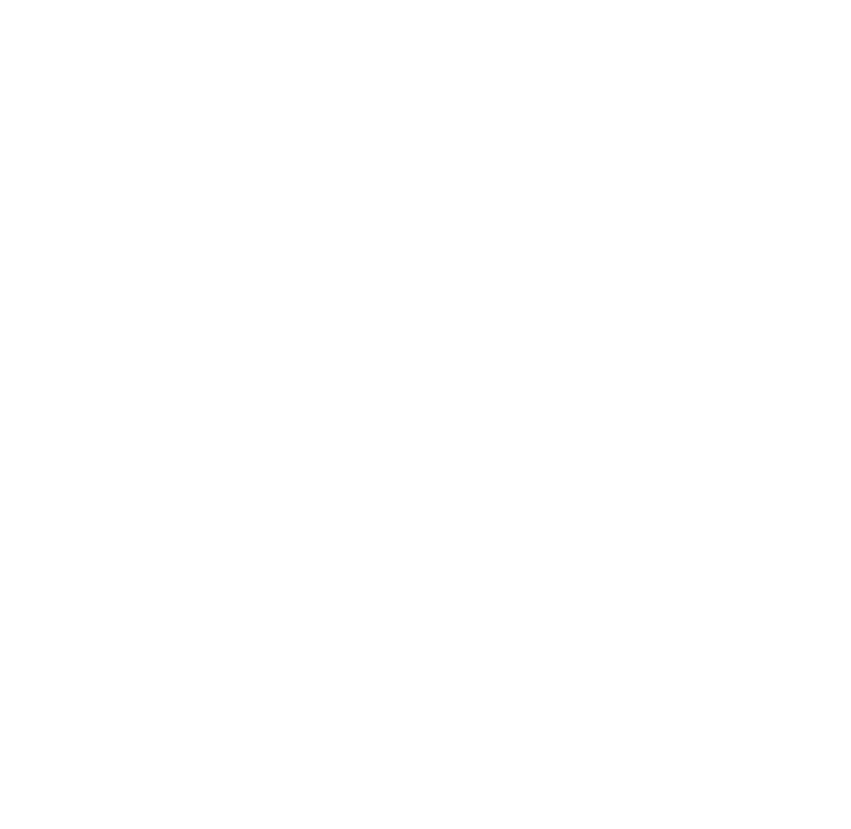

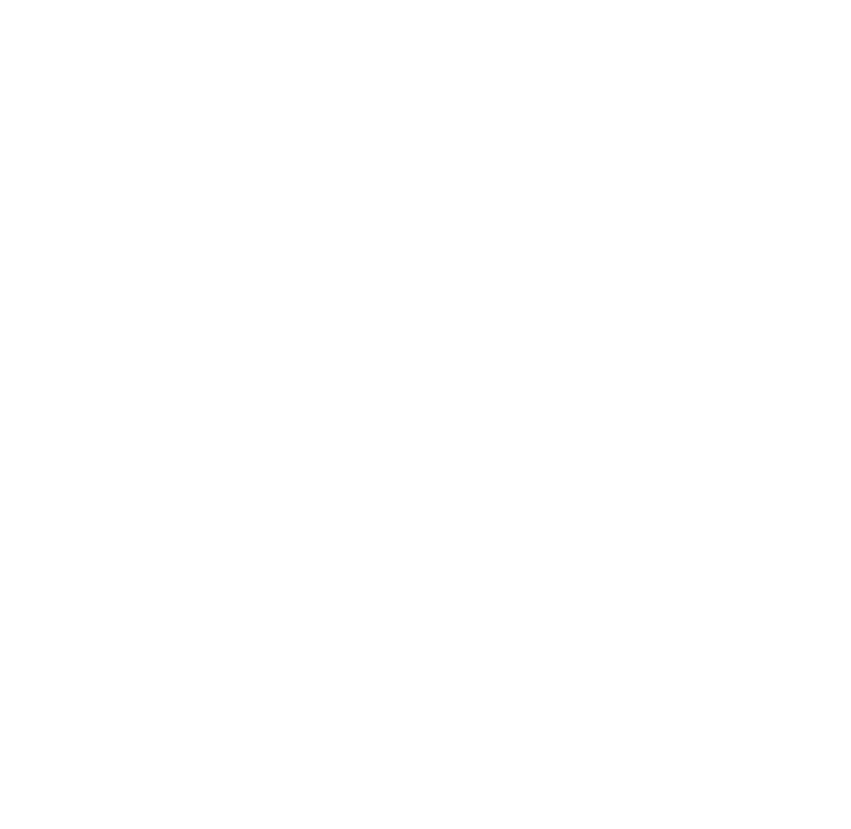

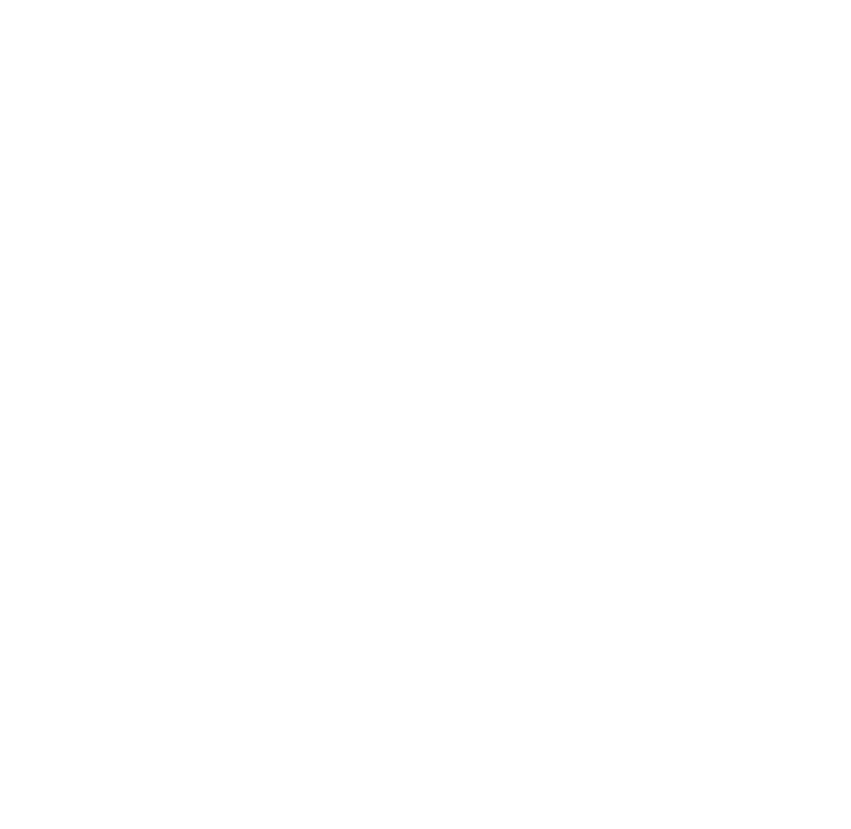

...

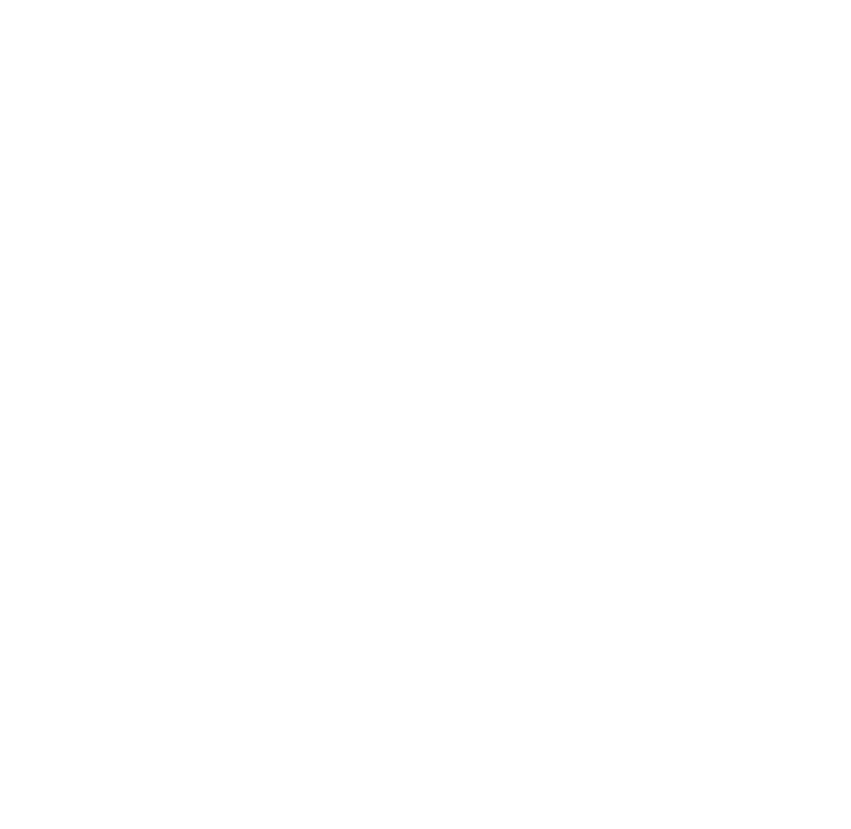

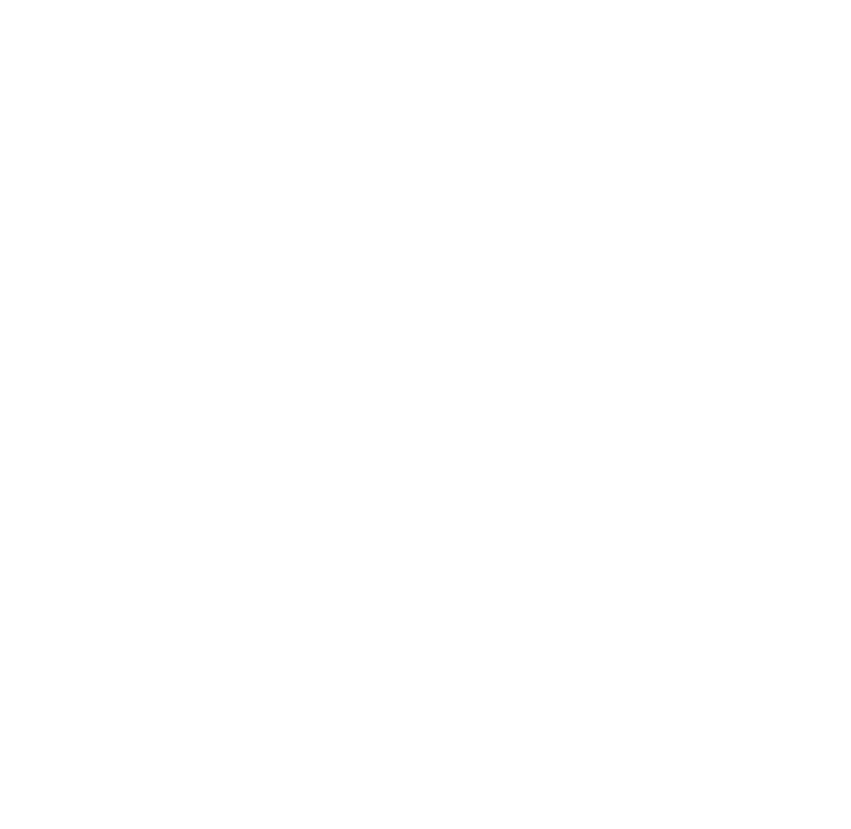

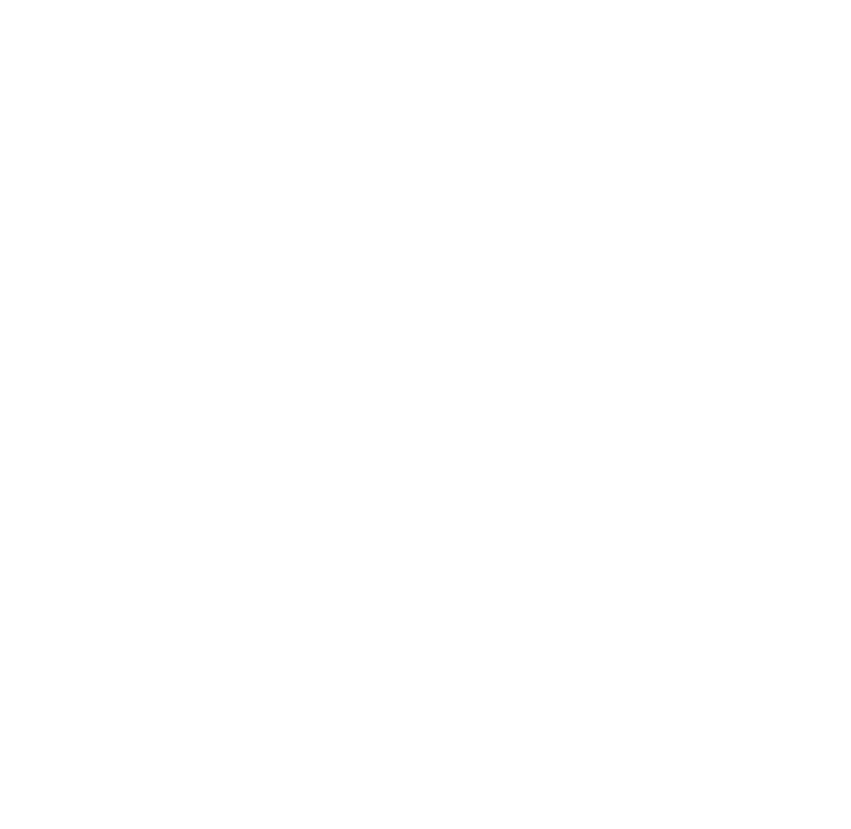

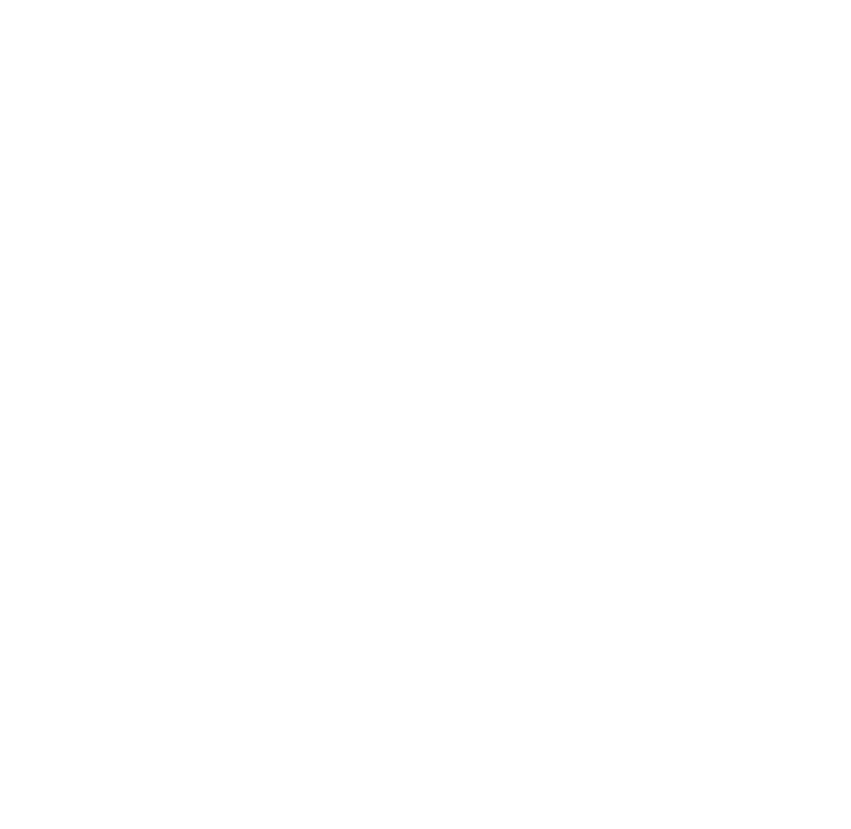

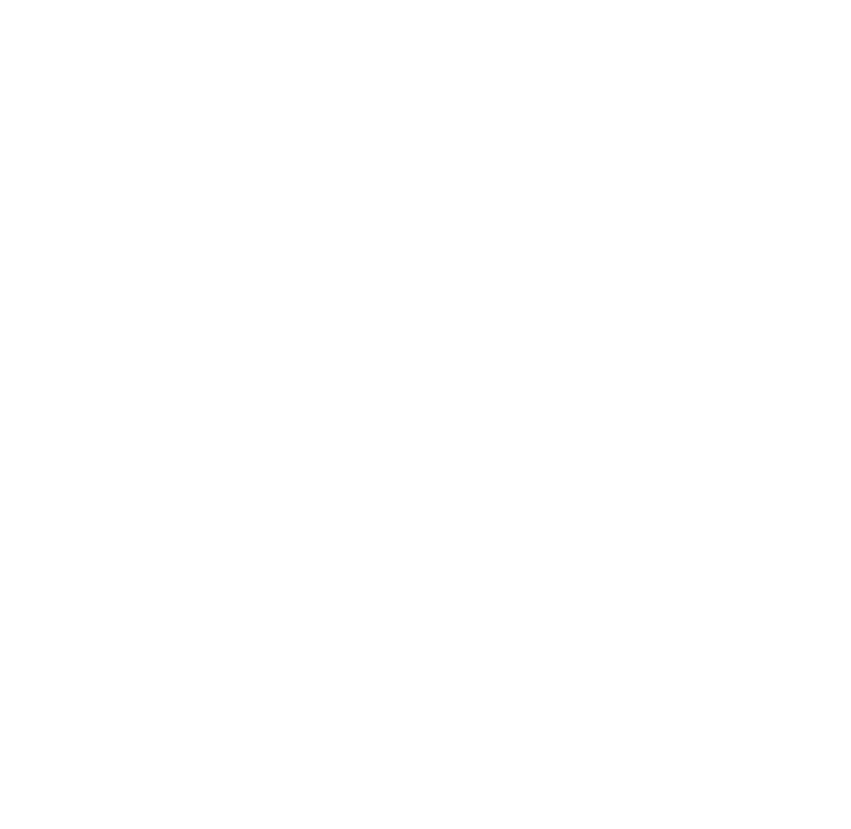

In [62]:
cap= cv2.VideoCapture(WEBCAM)

framenumber = 1
t1 = datetime.datetime.now() # Current datetime

print('Processing the video input: ', WEBCAM, 'for every', sampling_frames, 'frames\n')

while(cap.isOpened()):
    ret, frame = cap.read()
        
    if ret == False:
        break

    if framenumber%sampling_frames == 0: # sampling frames
        
        # Frontier definition
        lanes_left = (0, x_lanes_frontier)
        lanes_down = (x_lanes_frontier, w)
        
        # Printing informations
        currentdate = datetime.datetime.now()
        
        if len(str(framenumber)) == 1:
            framenumberstr = '000000' + str(framenumber)
        if len(str(framenumber)) == 2:
            framenumberstr = '00000' + str(framenumber)
        if len(str(framenumber)) == 3:
            framenumberstr = '0000' + str(framenumber)
        if len(str(framenumber)) == 4:
            framenumberstr = '000' + str(framenumber)
        if len(str(framenumber)) == 5:
            framenumberstr = '00' + str(framenumber)
        if len(str(framenumber)) == 6:
            framenumberstr = '0' + str(framenumber)
        
        print(currentdate, "Processing frame =", framenumberstr, '\n')
            
        # Saving frame
        cv2.imwrite('results/captures/frame_' + framenumberstr + '.jpg', frame) #Saving frame into image
        
        # Calling the yolo model
        img, preds = yolo.detectObjectsFromImage(input_image = frame, # Calling the model
                                         custom_objects = None, 
                                         input_type = "array",
                                         output_type = "array",
                                         minimum_percentage_probability = minpctprob,
                                         display_percentage_probability = True,
                                         display_object_name = True)
        
        # variables init
        counter1 = 1
        nb_cars = nb_trucks = nb_motos = nb_persons = nb_bus = nb_vehicles = 0
        l_nb_cars = l_nb_trucks = l_nb_motos = l_nb_persons = l_nb_bus = l_nb_vehicles = 0
        r_nb_cars = r_nb_trucks = r_nb_motos = r_nb_persons = r_nb_bus = r_nb_vehicles = 0
        
        # Parsing predictions
        for key in preds:
            print(counter1, '\t', str.upper(key['name']), ' ', round(key['percentage_probability']/100, 5), 
                  ' Bounding Box:', key['box_points'])
            
            if key['name'] == 'car':
                nb_cars += 1
            if key['name'] == 'truck':
                nb_trucks += 1
            if key['name'] == 'motorcycle':
                nb_motos += 1
            if key['name'] == 'person':
                nb_persons += 1
            if key['name'] == 'bus':
                nb_bus += 1
            
            roi = key['box_points']
            nb_vehicles = nb_cars + nb_trucks + nb_motos + nb_bus
            counter1 += 1
            
            # Center coordinates of ROIs
            x_center_roi = (roi[0] + roi[2]) / 2
            y_center_roi = (roi[1] + roi[3]) / 2
            
            if x_center_roi < x_lanes_frontier: # Counting vehicles from the left lanes
                    
                if key['name'] == 'car':
                    l_nb_cars += 1
                if key['name'] == 'truck':
                    l_nb_trucks += 1
                if key['name'] == 'motorcycle':
                    l_nb_motos += 1
                if key['name'] == 'person':
                    l_nb_persons += 1
                if key['name'] == 'bus':
                    l_nb_bus += 1
                l_nb_vehicles = l_nb_cars + l_nb_trucks + l_nb_motos + l_nb_bus
            
            if x_center_roi >= x_lanes_frontier: # Counting vehicles from the right lanes
                    
                if key['name'] == 'car':
                    r_nb_cars += 1
                if key['name'] == 'truck':
                    r_nb_trucks += 1
                if key['name'] == 'motorcycle':
                    r_nb_motos += 1
                if key['name'] == 'person':
                    r_nb_persons += 1
                if key['name'] == 'bus':
                    r_nb_bus += 1
                r_nb_vehicles = r_nb_cars + r_nb_trucks + r_nb_motos + r_nb_bus
        
        counter1 +=1
        
        # Traffic class
        
        if l_nb_vehicles < low_limit:
            traffic_left = "Low traffic"
            colorfont_traffic_l = (0, 100, 0)
        
        if l_nb_vehicles >= high_limit:
            traffic_left = "Heavy traffic"
            colorfont_traffic_l = (0, 0, 255)
        
        if l_nb_vehicles >= low_limit and l_nb_vehicles < high_limit:
            traffic_left = "Moderate traffic"
            colorfont_traffic_l = (0, 127, 255)
            
        if r_nb_vehicles < low_limit:
            traffic_right = "Low traffic"
            colorfont_traffic_r = (0, 100, 0)
        
        if r_nb_vehicles >= high_limit:
            traffic_right = "Heavy traffic"
            colorfont_traffic_r = (0, 0, 255)
        
        if r_nb_vehicles >= low_limit and l_nb_vehicles < high_limit:
            traffic_right = "Moderate traffic"
            colorfont_traffic_r = (0, 127, 255)

        # Printing informations
        print("\nStatistics:")
        print("Number of vehicles =", nb_vehicles)
        print("Including cars =", nb_cars)
        print("Including trucks =", nb_trucks)
        print("Including buses =", nb_bus)
        print("Including motorcycles =", nb_motos)
        print("Numbers of detected persons =", nb_persons)
        
        print("\nLeft Lanes Statistics:")
        print("Number of vehicles =", l_nb_vehicles)
        print("Traffic state:", traffic_left)
        print("Including cars =", l_nb_cars)
        print("Including trucks =", l_nb_trucks)
        print("Including buses =", l_nb_bus)
        print("Including motorcycles =", l_nb_motos)
        print("Numbers of detected persons =", l_nb_persons)
        
        print("\nRight Lanes Statistics:")
        print("Number of vehicles =", r_nb_vehicles)
        print("Traffic state:", traffic_right)
        print("Including cars =", r_nb_cars)
        print("Including trucks =", r_nb_trucks)
        print("Including buses =", r_nb_bus)
        print("Including motorcycles =", r_nb_motos)
        print("Numbers of detected persons =", r_nb_persons)
        
        # Logging to Azure ML experiments
        now = time.strftime('%d/%m/%Y %H:%M:%S')
        run.log("date", now)
        run.log("frame", framenumberstr)
        
        run.log("number_vehicles", nb_vehicles)
        run.log("number_vehicles_left", l_nb_vehicles)
        run.log("number_vehicles_right", r_nb_vehicles)
        run.log("traffic_state_right", traffic_right)
        run.log("traffic_state_left", traffic_left)

        run.log("numbers_cars_left", l_nb_cars)
        run.log("numbers_trucks_left", l_nb_trucks)
        run.log("numbers_bus_left", l_nb_bus)
        run.log("numbers_motorcycles_left",l_nb_motos)
        run.log("numbers_persons_left", l_nb_persons)
        
        run.log("numbers_cars_right", r_nb_cars)
        run.log("numbers_trucks_right", r_nb_trucks)
        run.log("numbers_bus_right", r_nb_bus)
        run.log("numbers_motorcycles_right", r_nb_motos)
        run.log("numbers_persons_right", r_nb_persons)
                
        plt.figure(figsize=(15,15)) 
        plt.axis('off')
        
        # Color definitions
        color_lime = (0, 255, 0)
        color_cyan = (255, 255, 0)
        color_red = (0, 0, 255)
        color_blue = (255, 0, 0)
        
        # Plots informations
        thickness1 = 2
        thickness2 = 1
        fontsize1 = 1
        fontsize2 = 0.8
        
        # Vertical reference line
        cv2.line(img, (x_lanes_frontier, 0), (x_lanes_frontier, h), color_lime, 2) # Frontier line
        
        # Creation of text informations
        msgdate = str(currentdate)
        msgframe = "Frame : " + framenumberstr
        msgcamera = "Camera 1"
        totalvehicles = "Total number of vehicules = " + str(nb_vehicles)
        totalvehiclesl = "Total number of vehicules in Left = " + str(l_nb_vehicles)
        totalvehiclesr = "Total number of vehicules in Right = " + str(r_nb_vehicles)
        
        totalcars = l_nb_cars + r_nb_cars
        totaltrucks = l_nb_trucks + r_nb_trucks
        totalbuses = l_nb_bus + r_nb_bus
        totalmotos = l_nb_motos + r_nb_motos
        totalpersons = l_nb_persons + r_nb_persons
        
        run.log("totalcars", totalcars)
        run.log("totaltrucks", totaltrucks)
        run.log("totalbuses", totalbuses)
        run.log("totalmotos", totalmotos)
        run.log("totalpersons", totalpersons)
        
        totalcarsl = "Cars in Left = " + str(l_nb_cars)
        totaltrucksl = "Trucks in Left = " + str(l_nb_trucks)
        totalbusesl = "Buses in Left = " + str(l_nb_bus)
        totalmotosl = "Motorcycles in Left = " + str(l_nb_motos)
        totalpersonsl = "Persons in Left = " + str(l_nb_persons)
        
        totalcarsr = "Cars in Right = " + str(r_nb_cars)
        totaltrucksr = "Trucks in Right = " + str(r_nb_trucks)
        totalbusesr = "Buses in Right = " + str(r_nb_bus)
        totalmotosr = "Motorcycles in Right = " + str(r_nb_motos)
        totalpersonsr = "Persons in Right = " + str(r_nb_persons)

        coordmsg1 = x_lanes_frontier + 50
        coordmsg2 = x_lanes_frontier + 200
        coordmsg3 = x_lanes_frontier + 300
        
        msgstrafficl = "Traffic state: " + str(traffic_left)
        msgstrafficr = "Traffic state: " + str(traffic_right)
        
        # OpenCV text displays
        cv2.putText(img, msgdate, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, fontsize1, color_lime, thickness1)
        cv2.putText(img, msgcamera, (coordmsg1, 30), cv2.FONT_HERSHEY_SIMPLEX, fontsize1, color_lime, thickness1)       
        cv2.putText(img, msgframe, (coordmsg2 + 130, 30), cv2.FONT_HERSHEY_SIMPLEX, fontsize1, color_lime, thickness1)
        
        cv2.putText(img, totalvehicles, (10, 80), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_blue, thickness1)
        cv2.putText(img, totalvehiclesl, (10, 130), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_red, thickness1)
        cv2.putText(img, totalvehiclesr, (coordmsg1, 130), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_red, thickness1)
        
        cv2.putText(img, msgstrafficl, (10, 160), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, colorfont_traffic_l, thickness1)
        cv2.putText(img, msgstrafficr, (coordmsg1, 160), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, colorfont_traffic_r, 
                    thickness1)
        
        cv2.putText(img, totalcarsl, (10, 220), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totaltrucksl, (10, 250), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totalbusesl, (10, 280), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totalmotosl, (10, 310), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totalpersonsl, (10, 340), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        
        cv2.putText(img, totalcarsr, (coordmsg3, 220), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totaltrucksr, (coordmsg3, 250), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totalbusesr, (coordmsg3, 280), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totalmotosr, (coordmsg3, 310), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        cv2.putText(img, totalpersonsr, (coordmsg3, 340), cv2.FONT_HERSHEY_SIMPLEX, fontsize2, color_cyan, thickness1)
        
        # Saving processed frame to a jpg file format
        jpgimagefile = 'results/processed_frame_' + framenumberstr + '.jpg'
        cv2.imwrite(jpgimagefile, img) # Saving image with results
        run.log_image(name = 'processedimage', path = jpgimagefile)
        
        print('\n/// Processing next frame ... ///', '\n')
    
    framenumber += 1

t2 = datetime.datetime.now()
print(t2, 'Done in:', t2 - t1)
cap.release()

## 6. Reports
Captured images are saved into a dedicated directory.<br>
Processed images with results are saved into an another dedicated directory

In [63]:
file_count1 = sum(len(files) for _, _, files in os.walk('results/captures')) # dir where the captured frames are
print("Number of captured frames =", file_count1)

Number of captured frames = 375


### One captured frame from the video

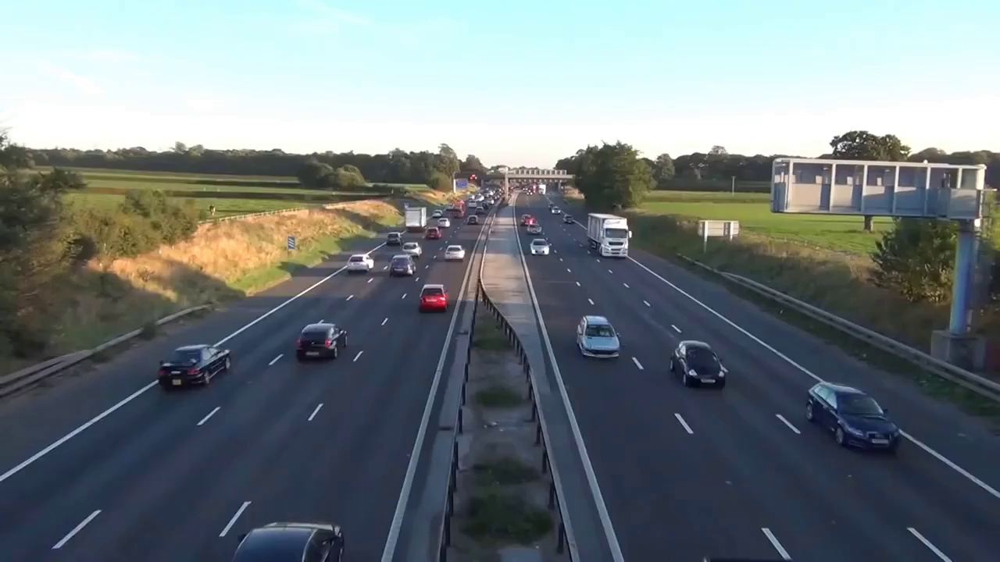

In [64]:
# One captured frame
from IPython.display import Image
myimage1 = 'results/captures/frame_0000001.jpg'
Image(filename = myimage1) 

### One processed image

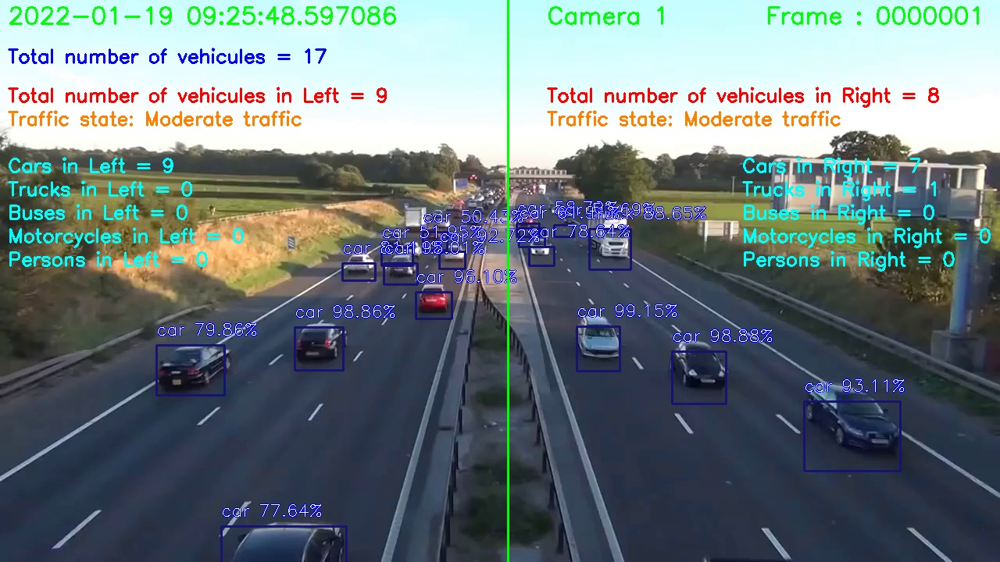

In [66]:
# One processed frame
myimage2 = 'results/processed_frame_0000001.jpg'
Image(filename = myimage2)

### 6.1 Azure ML experiment

In [67]:
experiment

Name,Workspace,Report Page,Docs Page
TrafficFlowAnalysis,AMLworkshop,Link to Azure Machine Learning studio,Link to Documentation


### 6.2 Retrieving logged metrics

In [68]:
videoresults = run.get_metrics() # Get Metrics from the Azure ML experiment
videoresults_df = pd.DataFrame(videoresults) # Convert to a pandas df

In [69]:
videoresults_df.shape

(375, 23)

In [70]:
videoresults_df.dtypes

date                         object
frame                        object
number_vehicles               int64
number_vehicles_left          int64
number_vehicles_right         int64
traffic_state_right          object
traffic_state_left           object
numbers_cars_left             int64
numbers_trucks_left           int64
numbers_bus_left              int64
numbers_motorcycles_left      int64
numbers_persons_left          int64
numbers_cars_right            int64
numbers_trucks_right          int64
numbers_bus_right             int64
numbers_motorcycles_right     int64
numbers_persons_right         int64
totalcars                     int64
totaltrucks                   int64
totalbuses                    int64
totalmotos                    int64
totalpersons                  int64
processedimage               object
dtype: object

In [71]:
videoresults_df.head(5)

,date,frame,number_vehicles,number_vehicles_left,number_vehicles_right,traffic_state_right,traffic_state_left,numbers_cars_left,numbers_trucks_left,numbers_bus_left,...,numbers_trucks_right,numbers_bus_right,numbers_motorcycles_right,numbers_persons_right,totalcars,totaltrucks,totalbuses,totalmotos,totalpersons,processedimage
0,19/01/2022 09:25:54,0000001,17,9,8,Moderate traffic,Moderate traffic,9,0,0,...,1,0,0,0,16,1,0,0,0,aml://artifactId/ExperimentRun/dcid.e28761dd-9...
1,19/01/2022 09:25:59,0000002,17,9,8,Moderate traffic,Moderate traffic,9,0,0,...,1,0,0,0,16,1,0,0,0,aml://artifactId/ExperimentRun/dcid.e28761dd-9...
2,19/01/2022 09:26:04,0000003,17,9,8,Moderate traffic,Moderate traffic,9,0,0,...,1,0,0,0,16,1,0,0,0,aml://artifactId/ExperimentRun/dcid.e28761dd-9...
3,19/01/2022 09:26:09,0000004,16,9,7,Moderate traffic,Moderate traffic,9,0,0,...,1,0,0,0,15,1,0,0,0,aml://artifactId/ExperimentRun/dcid.e28761dd-9...
4,19/01/2022 09:26:16,0000005,16,8,8,Moderate traffic,Moderate traffic,8,0,0,...,2,0,0,0,14,2,0,0,0,aml://artifactId/ExperimentRun/dcid.e28761dd-9...


In [72]:
videoresults_df.tail(5)

,date,frame,number_vehicles,number_vehicles_left,number_vehicles_right,traffic_state_right,traffic_state_left,numbers_cars_left,numbers_trucks_left,numbers_bus_left,...,numbers_trucks_right,numbers_bus_right,numbers_motorcycles_right,numbers_persons_right,totalcars,totaltrucks,totalbuses,totalmotos,totalpersons,processedimage
370,19/01/2022 09:57:57,0000371,16,9,7,Moderate traffic,Moderate traffic,9,0,0,...,1,0,0,0,15,1,0,0,0,aml://artifactId/ExperimentRun/dcid.e28761dd-9...
371,19/01/2022 09:58:02,0000372,16,8,8,Moderate traffic,Moderate traffic,8,0,0,...,1,0,0,0,15,1,0,0,0,aml://artifactId/ExperimentRun/dcid.e28761dd-9...
372,19/01/2022 09:58:07,0000373,15,7,8,Moderate traffic,Moderate traffic,7,0,0,...,1,0,0,0,14,1,0,0,0,aml://artifactId/ExperimentRun/dcid.e28761dd-9...
373,19/01/2022 09:58:12,0000374,15,7,8,Moderate traffic,Moderate traffic,7,0,0,...,1,0,0,0,14,1,0,0,0,aml://artifactId/ExperimentRun/dcid.e28761dd-9...
374,19/01/2022 09:58:18,0000375,15,7,8,Moderate traffic,Moderate traffic,7,0,0,...,1,0,0,0,14,1,0,0,0,aml://artifactId/ExperimentRun/dcid.e28761dd-9...


In [73]:
videoresults_df.describe()

,number_vehicles,number_vehicles_left,number_vehicles_right,numbers_cars_left,numbers_trucks_left,numbers_bus_left,numbers_motorcycles_left,numbers_persons_left,numbers_cars_right,numbers_trucks_right,numbers_bus_right,numbers_motorcycles_right,numbers_persons_right,totalcars,totaltrucks,totalbuses,totalmotos,totalpersons
count,375.000000,375.000000,375.000000,375.000000,375.000000,375.000000,375.0,375.0,375.000000,375.000000,375.000000,375.0,375.0,375.000000,375.000000,375.000000,375.0,375.0
mean,12.882667,8.874667,4.008000,7.890667,0.960000,0.024000,0.0,0.0,3.085333,0.648000,0.274667,0.0,0.0,10.976000,1.608000,0.298667,0.0,0.0
std,2.550473,1.224864,2.003323,1.222032,0.843978,0.153253,0.0,0.0,1.599857,0.715631,0.591177,0.0,0.0,2.188194,0.999165,0.625974,0.0,0.0
min,8.000000,6.000000,1.000000,5.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,6.000000,0.000000,0.000000,0.0,0.0
25%,11.000000,8.000000,2.000000,7.000000,0.000000,0.000000,0.0,0.0,2.000000,0.000000,0.000000,0.0,0.0,9.000000,1.000000,0.000000,0.0,0.0
50%,12.000000,9.000000,3.000000,8.000000,1.000000,0.000000,0.0,0.0,3.000000,1.000000,0.000000,0.0,0.0,11.000000,1.000000,0.000000,0.0,0.0
75%,14.000000,9.000000,6.000000,9.000000,1.000000,0.000000,0.0,0.0,4.000000,1.000000,0.000000,0.0,0.0,12.000000,2.000000,0.000000,0.0,0.0
max,19.000000,12.000000,10.000000,11.000000,4.000000,1.000000,0.0,0.0,8.000000,3.000000,2.000000,0.0,0.0,16.000000,4.000000,2.000000,0.0,0.0


### 6.3 Statistics

In [74]:
videoresults_df['traffic_state_right'].value_counts()

Low traffic         248
Moderate traffic    127
Name: traffic_state_right, dtype: int64

In [75]:
videoresults_df['traffic_state_right'].value_counts(normalize=True)

Low traffic         0.661333
Moderate traffic    0.338667
Name: traffic_state_right, dtype: float64

In [80]:
createdir('reports') # Dir to save the graphs

Creating directory: reports
Done!


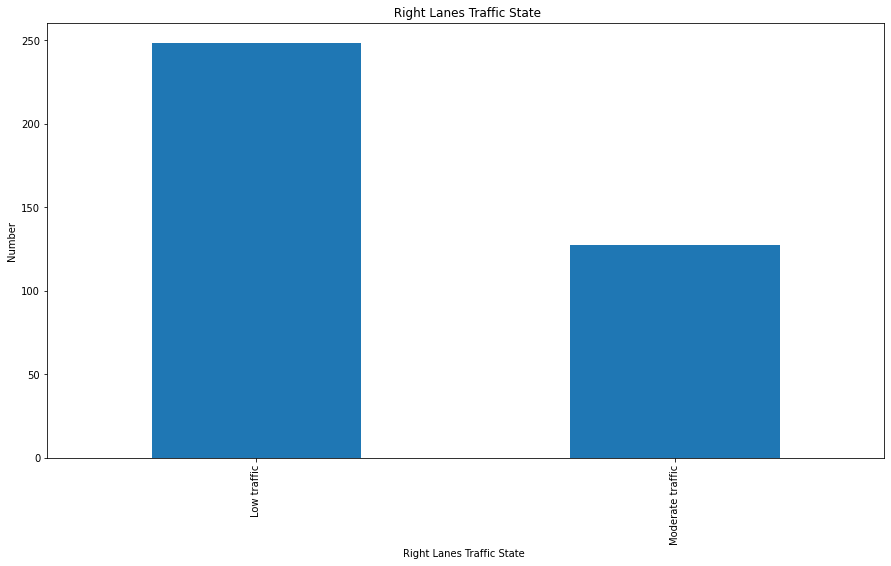

In [81]:
%matplotlib inline
import matplotlib.pyplot as plt

ax = videoresults_df['traffic_state_right'].value_counts().plot(kind='bar',
                                    figsize=(15,8),
                                    title=" Right Lanes Traffic State")

ax.set_xlabel("Right Lanes Traffic State ")
ax.set_ylabel("Number")
plt.savefig("reports/trafficstateright_plot.png", dpi=300)

In [82]:
videoresults_df['traffic_state_left'].value_counts()

Moderate traffic    283
Heavy traffic        92
Name: traffic_state_left, dtype: int64

In [83]:
videoresults_df['traffic_state_left'].value_counts(normalize=True)

Moderate traffic    0.754667
Heavy traffic       0.245333
Name: traffic_state_left, dtype: float64

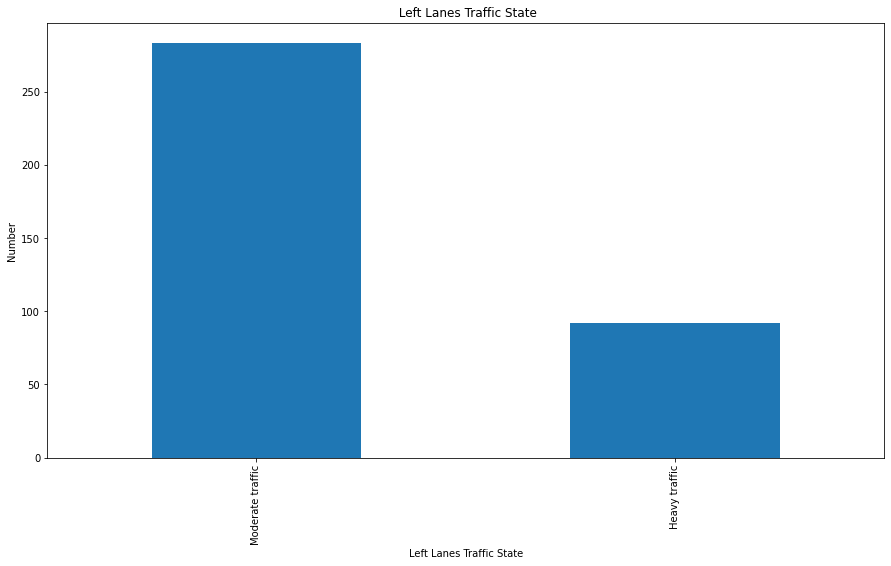

In [84]:
%matplotlib inline
import matplotlib.pyplot as plt

ax = videoresults_df['traffic_state_left'].value_counts().plot(kind='bar',
                                    figsize=(15,8),
                                    title=" Left Lanes Traffic State")

ax.set_xlabel("Left Lanes Traffic State")
ax.set_ylabel("Number")
plt.savefig("reports/trafficstateleft_plot.png", dpi=300)

#### Vehicles

In [86]:
print("----- Statistics about Vehicles -----\n")
print("Minimum")
print(videoresults_df[['number_vehicles', 'number_vehicles_left', 'number_vehicles_right']].min())
print("\nMaximum")
print(videoresults_df[['number_vehicles', 'number_vehicles_left', 'number_vehicles_right']].max())
print("\nMean")
print(videoresults_df[['number_vehicles', 'number_vehicles_left', 'number_vehicles_right']].mean())

----- Statistics about Vehicles -----

Minimum
number_vehicles          8
number_vehicles_left     6
number_vehicles_right    1
dtype: int64

Maximum
number_vehicles          19
number_vehicles_left     12
number_vehicles_right    10
dtype: int64

Mean
number_vehicles          12.882667
number_vehicles_left      8.874667
number_vehicles_right     4.008000
dtype: float64


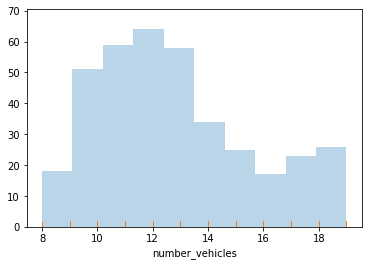

In [87]:
plt.hist(videoresults_df.number_vehicles, alpha=.3)
sns.rugplot(videoresults_df.number_vehicles)
plt.show()

<AxesSubplot:xlabel='number_vehicles', ylabel='Density'>

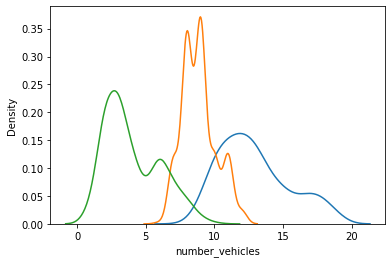

In [88]:
sns.kdeplot(videoresults_df.number_vehicles)
sns.kdeplot(videoresults_df.number_vehicles_left)
sns.kdeplot(videoresults_df.number_vehicles_right)

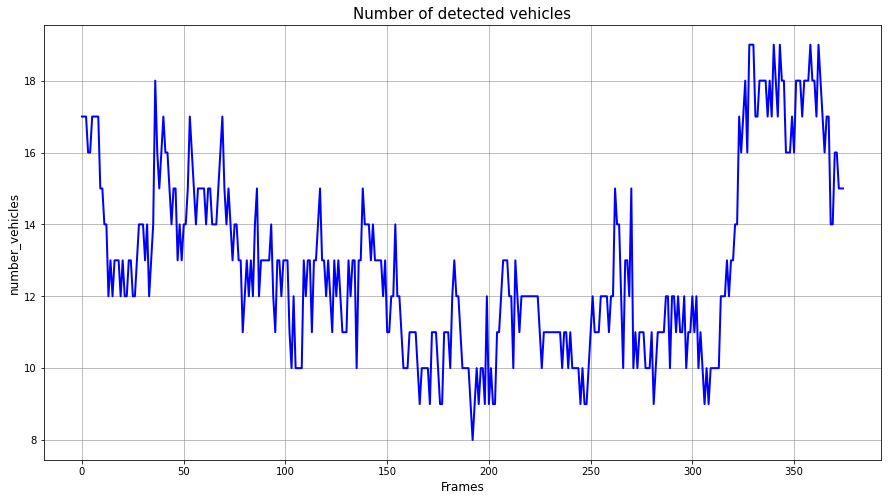

In [89]:
%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize = (15, 8))
plt.plot(videoresults_df['number_vehicles'], label='Number of vehicles', color='blue', linewidth = 2)
plt.xlabel('Frames', fontsize = 12)
plt.ylabel('number_vehicles', fontsize = 12)
plt.title('Number of detected vehicles', fontsize = 15)
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.savefig("reports/vehicules_plot.png", dpi=300)
plt.show()

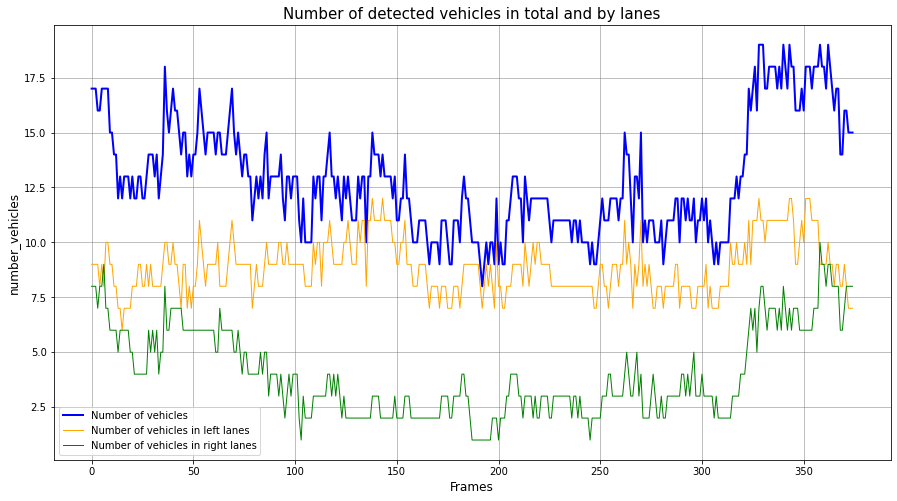

In [90]:
%matplotlib inline

plt.figure(figsize = (15, 8))
plt.plot(videoresults_df['number_vehicles'], label='Number of vehicles', color='blue', linewidth = 2)
plt.plot(videoresults_df['number_vehicles_left'], label='Number of vehicles in left lanes', color='orange', linewidth = 1)
plt.plot(videoresults_df['number_vehicles_right'], label='Number of vehicles in right lanes', color='green', linewidth = 1)
plt.legend()
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.xlabel('Frames', fontsize = 12)
plt.ylabel('number_vehicles', fontsize = 12)
plt.title('Number of detected vehicles in total and by lanes', fontsize = 15)

plt.savefig("reports/vehicules_plot2.png", dpi=300)
plt.show()

#### Cars only

In [92]:
print("----- Statistics about Cars -----\n")
print("---Minimum ---")
print(videoresults_df[['totalcars', 'numbers_cars_left', 'numbers_cars_right']].min())
print("\n--- Maximum ---")
print(videoresults_df[['totalcars','numbers_cars_left', 'numbers_cars_right']].max())
print("\n--- Mean ---")
print(videoresults_df[['totalcars','numbers_cars_left', 'numbers_cars_right']].mean())

----- Statistics about Cars -----

---Minimum ---
totalcars             6
numbers_cars_left     5
numbers_cars_right    0
dtype: int64

--- Maximum ---
totalcars             16
numbers_cars_left     11
numbers_cars_right     8
dtype: int64

--- Mean ---
totalcars             10.976000
numbers_cars_left      7.890667
numbers_cars_right     3.085333
dtype: float64


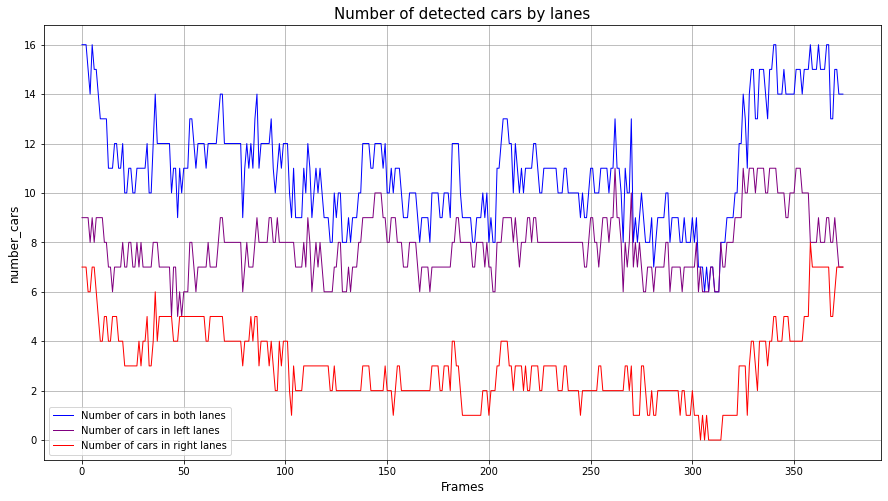

In [94]:
%matplotlib inline

plt.figure(figsize = (15, 8))
plt.plot(videoresults_df['totalcars'], label='Number of cars in both lanes', color='blue', linewidth = 1)
plt.plot(videoresults_df['numbers_cars_left'], label='Number of cars in left lanes', color='purple', linewidth = 1)
plt.plot(videoresults_df['numbers_cars_right'], label='Number of cars in right lanes', color='red', linewidth = 1)
plt.legend()
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.xlabel('Frames', fontsize = 12)
plt.ylabel('number_cars', fontsize = 12)
plt.title('Number of detected cars by lanes', fontsize = 15)

plt.savefig("reports/cars_plot.png", dpi=300)
plt.show()

#### Trucks only

In [95]:
print("----- Statistics about Trucks -----\n")
print("Minimum")
print(videoresults_df[['totaltrucks', 'numbers_trucks_left', 'numbers_trucks_right']].min())
print("\nMaximum")
print(videoresults_df[['totaltrucks', 'numbers_trucks_left', 'numbers_trucks_right']].max())
print("\nMean")
print(videoresults_df[['totaltrucks', 'numbers_trucks_left', 'numbers_trucks_right']].mean())

----- Statistics about Trucks -----

Minimum
totaltrucks             0
numbers_trucks_left     0
numbers_trucks_right    0
dtype: int64

Maximum
totaltrucks             4
numbers_trucks_left     4
numbers_trucks_right    3
dtype: int64

Mean
totaltrucks             1.608
numbers_trucks_left     0.960
numbers_trucks_right    0.648
dtype: float64


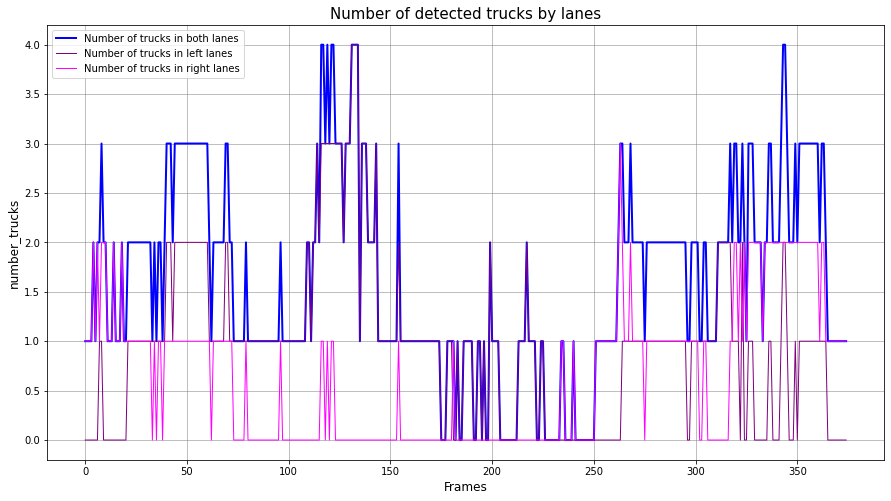

In [96]:
%matplotlib inline

plt.figure(figsize = (15, 8))
plt.plot(videoresults_df['totaltrucks'], label='Number of trucks in both lanes', color='blue', linewidth = 2)
plt.plot(videoresults_df['numbers_trucks_left'], label='Number of trucks in left lanes', color='purple', linewidth = 1)
plt.plot(videoresults_df['numbers_trucks_right'], label='Number of trucks in right lanes', color='magenta', linewidth = 1)
plt.legend()
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.xlabel('Frames', fontsize = 12)
plt.ylabel('number_trucks', fontsize = 12)
plt.title('Number of detected trucks by lanes', fontsize = 15)

plt.savefig("reports/trucks_plot.png", dpi=300)
plt.show()

#### Persons only

In [98]:
print("----- Statistics about Persons -----\n")
print("Minimum")
print(videoresults_df[['totalpersons', 'numbers_persons_left', 'numbers_persons_right']].min())
print("\nMaximum")
print(videoresults_df[['totalpersons','numbers_persons_left', 'numbers_persons_right']].max())
print("\nMean")
print(videoresults_df[['totalpersons','numbers_persons_left', 'numbers_persons_right']].mean())

----- Statistics about Persons -----

Minimum
totalpersons             0
numbers_persons_left     0
numbers_persons_right    0
dtype: int64

Maximum
totalpersons             0
numbers_persons_left     0
numbers_persons_right    0
dtype: int64

Mean
totalpersons             0.0
numbers_persons_left     0.0
numbers_persons_right    0.0
dtype: float64


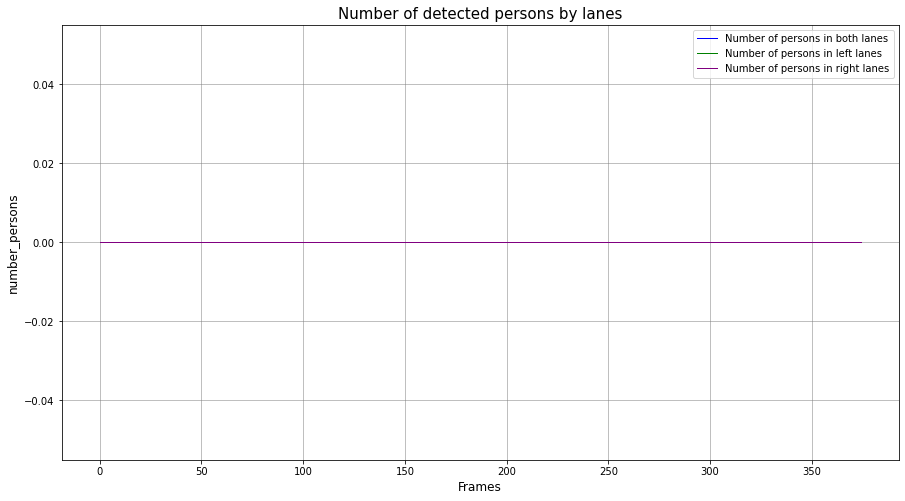

In [99]:
%matplotlib inline

plt.figure(figsize = (15, 8))
plt.plot(videoresults_df['totalpersons'], label='Number of persons in both lanes', color='blue', linewidth = 1)
plt.plot(videoresults_df['numbers_persons_left'], label='Number of persons in left lanes', color='green', linewidth = 1)
plt.plot(videoresults_df['numbers_persons_right'], label='Number of persons in right lanes', color='purple', linewidth = 1)
plt.legend()
plt.grid(color='gray', linestyle='-', linewidth=0.5)
plt.xlabel('Frames', fontsize = 12)
plt.ylabel('number_persons', fontsize = 12)
plt.title('Number of detected persons by lanes', fontsize = 15)

plt.savefig("reports/persons_plot.png", dpi=300)
plt.show()

### 6.4 Exporting metrics

In [100]:
EXCELFILE = 'reports/videometrics.xls'
CSVFILE = 'reports/videometrics.csv'

In [101]:
videoresults_df.to_excel(EXCELFILE, index = False, sheet_name = "predictions") # Excel export
videoresults_df.to_csv(CSVFILE, index = False) # CSV export

In [103]:
!ls reports/*.xls -lh

-rwxrwxrwx 1 root root 98K Jan 19 10:03 reports/videometrics.xls


In [104]:
!ls reports/*.csv -lh

-rwxrwxrwx 1 root root 76K Jan 19 10:03 reports/videometrics.csv


In [105]:
from IPython.display import FileLink
xls_link = FileLink(path = EXCELFILE)
print("Link to download the Excel file:")
xls_link

Link to download the Excel file:


/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow5/code/Users/seretkow/ComputerVision/Vehicles Detection/reports/videometrics.xls

In [106]:
csv_link = FileLink(path = CSVFILE)
print("Link to download the CSV file:")
csv_link

Link to download the CSV file:


/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow5/code/Users/seretkow/ComputerVision/Vehicles Detection/reports/videometrics.csv

### 6.5 Saving the processed frames into a new video

In [132]:
results_path = 'results' # input images dir
video_output = 'processed_video.mp4' # Should be an MP4 file

In [108]:
output_path = 'videoresults' # dir to save the video
createdir(output_path) # create the dir

Creating directory: videoresults
Done!


In [134]:
import moviepy.video.io.ImageSequenceClip

image_folder = 'results' # Images to saved into a video file
video_outputfilename = output_path + '/' + video_output # result video file
fps_output = 25 # FPS for the video to generate

t1 = datetime.datetime.now()
print(t1, "Saving the frames into a video:", video_outputfilename, '\n')

image_files = [os.path.join(image_folder, img)
               for img in os.listdir(image_folder)
               if img.endswith(".jpg")]

clip = moviepy.video.io.ImageSequenceClip.ImageSequenceClip(image_files, fps = fps_output)
clip.write_videofile(video_outputfilename)

print('\nDone in', datetime.datetime.now()- t1)

2022-01-19 10:24:00.697815 Saving the frames into a video: videoresults/processed_video.mp4 

Moviepy - Building video videoresults/processed_video.mp4.
Moviepy - Writing video videoresults/processed_video.mp4



Moviepy - Done !
Moviepy - video ready videoresults/processed_video.mp4

Done in 0:00:49.178976


In [135]:
from IPython.display import FileLink

video_link = FileLink(path = video_outputfilename)
print("Link to download the video file:")
video_link

Link to download the video file:


/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow5/code/Users/seretkow/ComputerVision/Vehicles Detection/videoresults/processed_video.mp4

### 6.6 Filtering the results

In [111]:
videoresults_df.head(3)

,date,frame,number_vehicles,number_vehicles_left,number_vehicles_right,traffic_state_right,traffic_state_left,numbers_cars_left,numbers_trucks_left,numbers_bus_left,...,numbers_trucks_right,numbers_bus_right,numbers_motorcycles_right,numbers_persons_right,totalcars,totaltrucks,totalbuses,totalmotos,totalpersons,processedimage
0,19/01/2022 09:25:54,0000001,17,9,8,Moderate traffic,Moderate traffic,9,0,0,...,1,0,0,0,16,1,0,0,0,aml://artifactId/ExperimentRun/dcid.e28761dd-9...
1,19/01/2022 09:25:59,0000002,17,9,8,Moderate traffic,Moderate traffic,9,0,0,...,1,0,0,0,16,1,0,0,0,aml://artifactId/ExperimentRun/dcid.e28761dd-9...
2,19/01/2022 09:26:04,0000003,17,9,8,Moderate traffic,Moderate traffic,9,0,0,...,1,0,0,0,16,1,0,0,0,aml://artifactId/ExperimentRun/dcid.e28761dd-9...


#### Creating the selection

In [138]:
select_df = videoresults_df[videoresults_df['totaltrucks'] >= 3] # Selection

select_df = select_df['frame'] # Only the frame
print(select_df)
print("\nTotal of objects =", len(select_df))

8      0000009
40     0000041
41     0000042
42     0000043
44     0000045
        ...   
358    0000359
359    0000360
360    0000361
362    0000363
363    0000364
Name: frame, Length: 76, dtype: object

Total of objects = 76


#### Displaying a random image from the selection

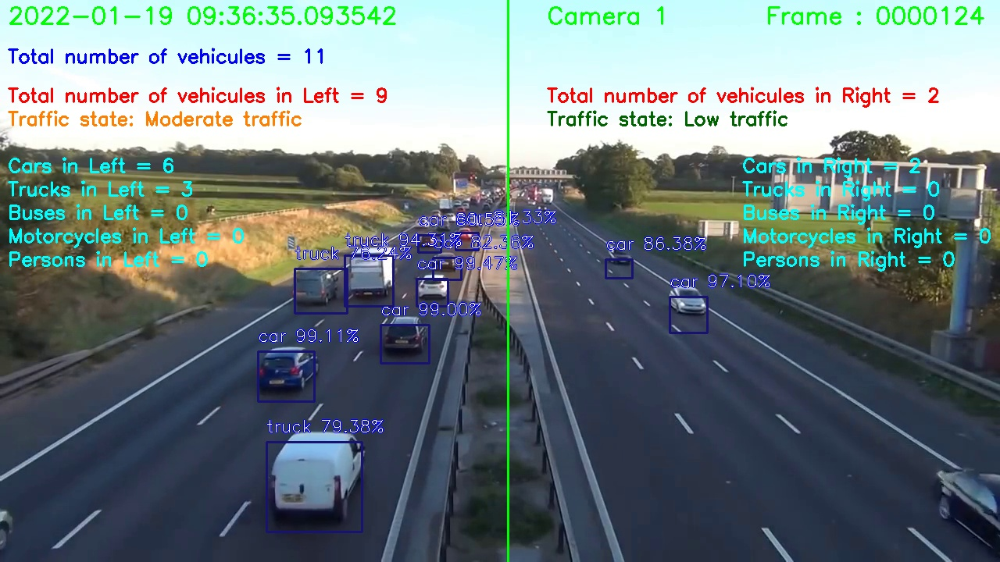

In [139]:
framenumber = select_df.iat[random.randint(0, len(select_df))] # Display a random value from the selection

from IPython.display import Image
randomimage = 'results/processed_frame_' + str(framenumber) + '.jpg'
Image(filename = randomimage) 